In [113]:
from __future__ import print_function
import os.path
import dalmatian as dm
import pandas as pd
import gseapy
from gseapy.plot import gseaplot, heatmap, barplot, dotplot
import sys
sys.path.insert(0, '..')
import Datanalytics as da 
import TerraFunction as terra
%load_ext autoreload
from Helper import *
%autoreload 2
%load_ext rpy2.ipython
from taigapy import TaigaClient
tc = TaigaClient()
import numpy as np
from bokeh.plotting import *
from bokeh.models import HoverTool
output_notebook()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from helper import pyDESeq2
from sklearn.neighbors import KNeighborsClassifier
from sklearn.manifold import MDS, TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from umap import UMAP

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


Loading BokehJS ...

### downloading from [terra](gs://fc-secure-639c94ba-2b0d-4960-92fc-9cd50046a968/326e42a6-1778-459e-9a95-e5dbc8c1bb67/rsem_aggregate_results_workflow/fc5be1ee-8888-4036-8aaf-df5770b4fefa/call-rsem_aggregate_results/MAX_AMLproject.rsem_genes_expected_count.txt.gz) and unziping 

In [22]:
# biggest change genes across time point
# GSEA
#counts = pd.read_csv("data/expression.MAX_AMLproject.counts.tsv", sep='\t')
counts = pd.read_csv("data/MAX_AMLproject.rsem_genes_expected_count.txt", sep='\t')
#transcripts = pd.read_csv("data/expression.MAX_AMLproject.transcripts.tsv", sep='\t')b

In [23]:
counts.shape

(58813, 32)

In [24]:
# we have a number of non zero similar to nb of prot coding genes
np.count_nonzero(counts.values[:,2:])/30

19360.8

In [25]:
counts.columns

Index(['gene_id', 'transcript_id(s)', '0h-A-RNA', '0h-B-RNA', '0h-C-RNA',
       '1A-24h-RNA', '1A-8h-RNA', '1B-24h-RNA', '1B-8h-RNA', '1C-24h-RNA',
       '1C-8h-RNA', '2A-16h-RNA', '2A-24h-RNA', '2A-2h-RNA', '2A-4h-RNA',
       '2A-8h-RNA', '2B-16h-RNA', '2B-24h-RNA', '2B-2h-RNA', '2B-4h-RNA',
       '2B-8h-RNA', '2C-16h-RNA', '2C-24h-RNA', '2C-2h-RNA', '2C-4h-RNA',
       '2C-8h-RNA', '3A-8h-RNA', '3B-8h-RNA', '3C-8h-RNA', '4A-8h-RNA',
       '4B-8h-RNA', '4C-8h-RNA'],
      dtype='object')

filter some more

In [26]:
toremove = np.argwhere(counts[counts.columns.values[2:]].values.var(1)==0)
toremove.ravel()

array([    1,    15,    24, ..., 58809, 58810, 58811])

In [27]:
counts = counts.drop(counts.index[toremove.ravel()],0)
counts = counts.reset_index()
counts = counts.drop(columns='index')

In [28]:
toremove = np.argwhere(counts[counts.columns.values[2:]].values.max(1)==0)
toremove.ravel()

array([], dtype=int64)

In [29]:
counts = counts.drop(counts.index[toremove.ravel()],0)
counts = counts.reset_index()
counts = counts.drop(columns='index')

In [30]:
counts = counts.drop('transcript_id(s)',1)
counts['gene_id'] = convertGenes(counts['gene_id'])[0]

you need access to taiga for this (https://pypi.org/project/taigapy/)
8135 could not be parsed... we don't have all genes already


The avg amount of expressed genes in the samples

In [31]:
np.count_nonzero(counts.values[:,2:])/30

18724.5

finding the different experiments

In [32]:
DMSO = '1'
MS2 = '2'
JQ1 = '3'
MS2_JQ1 = '4'
START = '0'

In [33]:
counts.columns

Index(['gene_id', '0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '1A-24h-RNA',
       '1A-8h-RNA', '1B-24h-RNA', '1B-8h-RNA', '1C-24h-RNA', '1C-8h-RNA',
       '2A-16h-RNA', '2A-24h-RNA', '2A-2h-RNA', '2A-4h-RNA', '2A-8h-RNA',
       '2B-16h-RNA', '2B-24h-RNA', '2B-2h-RNA', '2B-4h-RNA', '2B-8h-RNA',
       '2C-16h-RNA', '2C-24h-RNA', '2C-2h-RNA', '2C-4h-RNA', '2C-8h-RNA',
       '3A-8h-RNA', '3B-8h-RNA', '3C-8h-RNA', '4A-8h-RNA', '4B-8h-RNA',
       '4C-8h-RNA'],
      dtype='object')

In [34]:
counts

,gene_id,0h-A-RNA,0h-B-RNA,0h-C-RNA,1A-24h-RNA,1A-8h-RNA,1B-24h-RNA,1B-8h-RNA,1C-24h-RNA,1C-8h-RNA,...,2C-24h-RNA,2C-2h-RNA,2C-4h-RNA,2C-8h-RNA,3A-8h-RNA,3B-8h-RNA,3C-8h-RNA,4A-8h-RNA,4B-8h-RNA,4C-8h-RNA
0,TSPAN6,0.00,1.00,1.00,0.00,3.0,0.00,0.00,0.00,0.00,...,1.00,0.00,0.0,0.00,0.00,1.00,0.00,0.00,1.00,0.00
1,DPM1,319.00,257.00,338.00,261.00,246.0,259.00,352.00,169.00,374.00,...,308.00,287.00,441.0,335.00,356.00,306.00,416.00,386.00,404.00,390.00
2,SCYL3,97.37,79.53,88.76,99.19,113.7,96.48,126.73,43.64,119.06,...,133.01,112.16,151.3,112.12,133.27,126.75,145.26,148.45,154.96,148.52
3,C1orf112,191.63,144.47,200.24,136.81,160.3,160.52,209.27,82.36,137.94,...,155.99,125.84,131.7,143.88,117.73,111.25,136.74,90.55,121.04,117.48
4,FGR,476.00,430.00,497.00,478.00,235.0,535.00,234.00,263.00,255.00,...,614.00,347.00,330.0,254.00,90.00,84.00,90.00,83.00,68.00,99.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,ERCC-00131,0.00,0.00,0.00,1.00,0.0,0.00,0.00,0.00,0.00,...,0.00,1.00,1.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
30223,ERCC-00136,0.00,0.00,0.00,1.00,0.0,2.00,0.00,0.00,0.00,...,1.00,0.00,0.0,2.00,2.00,1.00,0.00,1.00,0.00,0.00
30224,ERCC-00145,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.00,0.00,...,0.00,0.00,0.0,0.00,0.00,1.00,0.00,0.00,0.00,0.00
30225,ERCC-00162,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.00,0.00,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [35]:
DMSO = [val[0]==DMSO for val in counts.columns.values]
DMSO_t = [int(val.split('-')[1][:-1]) if val[0]==DMSO else 0 for val in counts.columns.values]
START = [val[0]==START for val in counts.columns.values]
MS2_t = [int(val.split('-')[1][:-1]) if val[0]==MS2 else 0 for val in counts.columns.values]
MS2_24 = [val == 24 for val in MS2_t]
MS2 = [val[0]==MS2 for val in counts.columns.values]
MS2_JQ1_t = [int(val.split('-')[1][:-1]) if val[0]==MS2_JQ1 else 0 for val in counts.columns.values]
MS2_JQ1 = [val[0]==MS2_JQ1 for val in counts.columns.values]
JQ1_t = [int(val.split('-')[1][:-1]) if val[0]==JQ1 else 0 for val in counts.columns.values]
JQ1 = [val[0]==JQ1 for val in counts.columns.values]

In [74]:
checks = [('0','0h'),('1','-8h'),('1','-24h'),('2','-2h'),('2','-4h'),('2','-8h'),
          ('2','-16h'),('2','-24h'),('3','-8h'),('4','-8h')]

In [75]:
design = pd.DataFrame(columns=counts.columns.values[1:], 
                      index=['START','DMSO_8','DMSO_24','MS2_2','MS2_4','MS2_8', 'MS2_16', 'MS2_24', 'JQ1_8', 'MS2_JQ1_8'], 
                      data=np.array(
                          [[1 if check[0]== val[0] and check[1] in val else 0 for val in counts.columns.values[1:]] for check in checks]))

In [76]:
design = design.T

In [77]:
design.index = ['X'+i.replace('-','.') for i in design.index]

In [78]:
res = {}

In [79]:
counts

,gene_id,0h-A-RNA,0h-B-RNA,0h-C-RNA,1A-24h-RNA,1A-8h-RNA,1B-24h-RNA,1B-8h-RNA,1C-24h-RNA,1C-8h-RNA,...,2C-24h-RNA,2C-2h-RNA,2C-4h-RNA,2C-8h-RNA,3A-8h-RNA,3B-8h-RNA,3C-8h-RNA,4A-8h-RNA,4B-8h-RNA,4C-8h-RNA
0,TSPAN6,0.00,1.00,1.00,0.00,3.0,0.00,0.00,0.00,0.00,...,1.00,0.00,0.0,0.00,0.00,1.00,0.00,0.00,1.00,0.00
1,DPM1,319.00,257.00,338.00,261.00,246.0,259.00,352.00,169.00,374.00,...,308.00,287.00,441.0,335.00,356.00,306.00,416.00,386.00,404.00,390.00
2,SCYL3,97.37,79.53,88.76,99.19,113.7,96.48,126.73,43.64,119.06,...,133.01,112.16,151.3,112.12,133.27,126.75,145.26,148.45,154.96,148.52
3,C1orf112,191.63,144.47,200.24,136.81,160.3,160.52,209.27,82.36,137.94,...,155.99,125.84,131.7,143.88,117.73,111.25,136.74,90.55,121.04,117.48
4,FGR,476.00,430.00,497.00,478.00,235.0,535.00,234.00,263.00,255.00,...,614.00,347.00,330.0,254.00,90.00,84.00,90.00,83.00,68.00,99.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,ERCC-00131,0.00,0.00,0.00,1.00,0.0,0.00,0.00,0.00,0.00,...,0.00,1.00,1.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
30223,ERCC-00136,0.00,0.00,0.00,1.00,0.0,2.00,0.00,0.00,0.00,...,1.00,0.00,0.0,2.00,2.00,1.00,0.00,1.00,0.00,0.00
30224,ERCC-00145,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.00,0.00,...,0.00,0.00,0.0,0.00,0.00,1.00,0.00,0.00,0.00,0.00
30225,ERCC-00162,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.00,0.00,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [80]:
design

,START,DMSO_8,DMSO_24,MS2_2,MS2_4,MS2_8,MS2_16,MS2_24,JQ1_8,MS2_JQ1_8
X0h.A.RNA,1,0,0,0,0,0,0,0,0,0
X0h.B.RNA,1,0,0,0,0,0,0,0,0,0
X0h.C.RNA,1,0,0,0,0,0,0,0,0,0
X1A.24h.RNA,0,0,1,0,0,0,0,0,0,0
X1A.8h.RNA,0,1,0,0,0,0,0,0,0,0
X1B.24h.RNA,0,0,1,0,0,0,0,0,0,0
X1B.8h.RNA,0,1,0,0,0,0,0,0,0,0
X1C.24h.RNA,0,0,1,0,0,0,0,0,0,0
X1C.8h.RNA,0,1,0,0,0,0,0,0,0,0
X2A.16h.RNA,0,0,0,0,0,0,1,0,0,0


In [81]:
design.sum(0)

START        3
DMSO_8       3
DMSO_24      3
MS2_2        3
MS2_4        3
MS2_8        3
MS2_16       3
MS2_24       3
JQ1_8        3
MS2_JQ1_8    3
dtype: int64

In [82]:
for val in design.columns.values[1:]:
    cols = [counts.columns[1:][i] for i, a in enumerate(design[['START',val]].values.sum(1)) if a]+['gene_id']
    print(cols, val)
    data = counts[cols]
    data.columns = ['X'+i.replace('-','.') for i in data.columns]
    d = design[['START',val]][design[['START',val]].sum(1)==1]
    deseq = pyDESeq2.pyDESeq2(count_matrix=data,
                              design_matrix = d,
             design_formula="~START - "+val,
             gene_column="Xgene_id")
    deseq.run_deseq()
    deseq.get_deseq_result()
    MS2res = deseq.deseq_result
    MS2res.pvalue = np.nan_to_num(np.array(MS2res.pvalue), 1)
    MS2res.log2FoldChange = - np.nan_to_num(np.array(MS2res.log2FoldChange), 0)
    res[val] = MS2res

['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', 'gene_id'] DMSO_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '1A-24h-RNA', '1B-24h-RNA', '1C-24h-RNA', 'gene_id'] DMSO_24
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '2A-2h-RNA', '2B-2h-RNA', '2C-2h-RNA', 'gene_id'] MS2_2
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: -- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '2A-4h-RNA', '2B-4h-RNA', '2C-4h-RNA', 'gene_id'] MS2_4
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '2A-8h-RNA', '2B-8h-RNA', '2C-8h-RNA', 'gene_id'] MS2_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '2A-16h-RNA', '2B-16h-RNA', '2C-16h-RNA', 'gene_id'] MS2_16
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '2A-24h-RNA', '2B-24h-RNA', '2C-24h-RNA', 'gene_id'] MS2_24
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '3A-8h-RNA', '3B-8h-RNA', '3C-8h-RNA', 'gene_id'] JQ1_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['0h-A-RNA', '0h-B-RNA', '0h-C-RNA', '4A-8h-RNA', '4B-8h-RNA', '4C-8h-RNA', 'gene_id'] MS2_JQ1_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



In [83]:
res.keys()

dict_keys(['DMSO_8', 'DMSO_24', 'MS2_2', 'MS2_4', 'MS2_8', 'MS2_16', 'MS2_24', 'JQ1_8', 'MS2_JQ1_8'])

In [84]:
ctf=pd.read_csv('data/CTF.csv',header=None)[0].values.tolist()
ctf.remove('IKAROS')
ctf

['MYC',
 'MYB',
 'SPI1',
 'RUNX1',
 'GSE1',
 'IRF2BP2',
 'FLI1',
 'ELF2',
 'ZEB2',
 'GFI1',
 'LMO2',
 'CEBPA',
 'MEF2D',
 'MEF2C',
 'IRF8',
 'MEIS1',
 'RUNX2',
 'ETV6',
 'LDB1',
 'RUNX2',
 'SP1',
 'ZMYND8']

In [85]:
for k, val in res.items():
    a = volcano(val.rename(columns={'Xgene_id':'gene_id'}),tohighlight=ctf,title=k)
    try:
        show(a)
        save(a,k+'.html')
    except RuntimeError:
        show(a)

/home/jeremie/.local/lib/python3.7/site-packages/bokeh/io/saving.py:126: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/jeremie/.local/lib/python3.7/site-packages/bokeh/io/saving.py:139: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


In [88]:
for val in design.columns.values[4:]:
    cols = [counts.columns[1:][i] for i, a in enumerate(design[['DMSO_8',val]].values.sum(1)) if a]+['gene_id']
    print(cols, val)
    data = counts[cols]
    data.columns = ['X'+i.replace('-','.') for i in data.columns]
    d = design[['DMSO_8',val]][design[['DMSO_8',val]].sum(1)==1]
    deseq = pyDESeq2.pyDESeq2(count_matrix=data,
                              design_matrix = d,
             design_formula="~DMSO_8 - "+val,
             gene_column="Xgene_id")
    deseq.run_deseq()
    deseq.get_deseq_result()
    MS2res = deseq.deseq_result
    MS2res.pvalue = np.nan_to_num(np.array(MS2res.pvalue), 1)
    MS2res.log2FoldChange = - np.nan_to_num(np.array(MS2res.log2FoldChange), 0)
    res[val] = MS2res

['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '2A-4h-RNA', '2B-4h-RNA', '2C-4h-RNA', 'gene_id'] MS2_4
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '2A-8h-RNA', '2B-8h-RNA', '2C-8h-RNA', 'gene_id'] MS2_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '2A-16h-RNA', '2B-16h-RNA', '2C-16h-RNA', 'gene_id'] MS2_16
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '2A-24h-RNA', '2B-24h-RNA', '2C-24h-RNA', 'gene_id'] MS2_24
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: -- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '3A-8h-RNA', '3B-8h-RNA', '3C-8h-RNA', 'gene_id'] JQ1_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-8h-RNA', '1B-8h-RNA', '1C-8h-RNA', '4A-8h-RNA', '4B-8h-RNA', '4C-8h-RNA', 'gene_id'] MS2_JQ1_8
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



In [91]:
for k, val in res.items():
    if k in ['MS2_4','MS2_8','MS2_16','MS2_24','JQ1_8','MS2_JQ1_8']:
        a = volcano(val.rename(columns={'Xgene_id':'gene_id'}),tohighlight=ctf,title=k)
        try:
            show(a)
            save(a,k+'.html')
        except RuntimeError:
            show(a)

In [92]:
for val in design.columns[[6,7]]:
    cols = [counts.columns[1:][i] for i, a in enumerate(design[['DMSO_24',val]].values.sum(1)) if a]+['gene_id']
    print(cols, val)
    data = counts[cols]
    data.columns = ['X'+i.replace('-','.') for i in data.columns]
    d = design[['DMSO_24',val]][design[['DMSO_24',val]].sum(1)==1]
    deseq = pyDESeq2.pyDESeq2(count_matrix=data,
                              design_matrix = d,
             design_formula="~DMSO_24 - "+val,
             gene_column="Xgene_id")
    deseq.run_deseq()
    deseq.get_deseq_result()
    MS2res = deseq.deseq_result
    MS2res.pvalue = np.nan_to_num(np.array(MS2res.pvalue), 1)
    MS2res.log2FoldChange = - np.nan_to_num(np.array(MS2res.log2FoldChange), 0)
    res[val] = MS2res

['1A-24h-RNA', '1B-24h-RNA', '1C-24h-RNA', '2A-16h-RNA', '2B-16h-RNA', '2C-16h-RNA', 'gene_id'] MS2_16
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



['1A-24h-RNA', '1B-24h-RNA', '1C-24h-RNA', '2A-24h-RNA', '2B-24h-RNA', '2C-24h-RNA', 'gene_id'] MS2_24
3.2.6


R[write to console]: estimating size factors

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: final dispersion estimates

R[write to console]: fitting model and testing



In [93]:
for k, val in res.items():
    if k in ['MS2_16','MS2_24']:
        a = volcano(val.rename(columns={'Xgene_id':'gene_id'}),tohighlight=ctf,title=k)
        try:
            show(a)
            save(a,k+'.html')
        except RuntimeError:
            show(a)

## GSEA

In [94]:
counts = counts.set_index('gene_id')

In [96]:
checks

[('0', '0h'),
 ('1', '-8h'),
 ('1', '-24h'),
 ('2', '-2h'),
 ('2', '-4h'),
 ('2', '-8h'),
 ('2', '-16h'),
 ('2', '-24h'),
 ('3', '-8h'),
 ('4', '-8h')]

In [105]:
names = list(res.keys())

In [110]:
res={}

('1', '-8h')
('1', '-24h')
('2', '-2h')
('2', '-4h')
('2', '-8h')
('2', '-16h')
('2', '-24h')
('3', '-8h')
('4', '-8h')


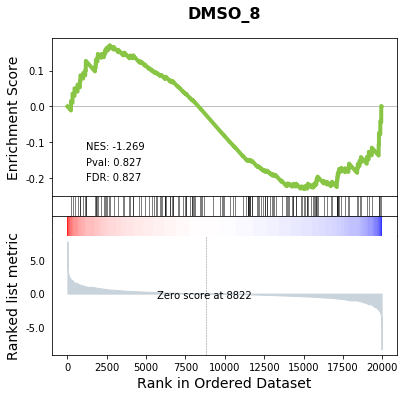

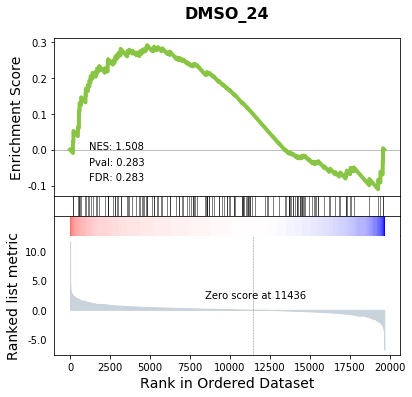

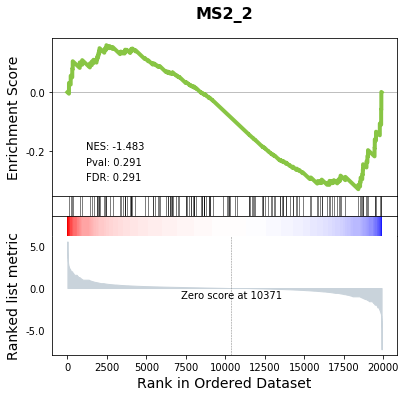

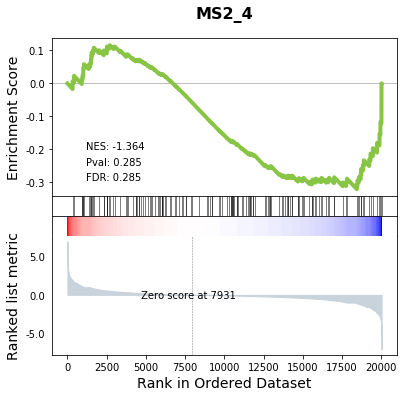

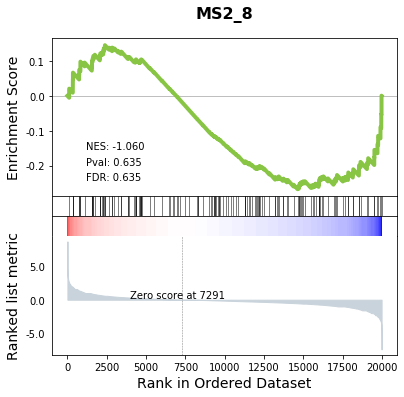

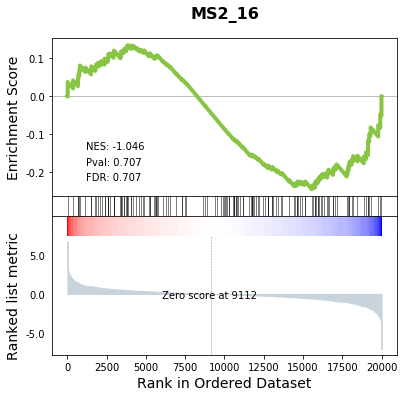

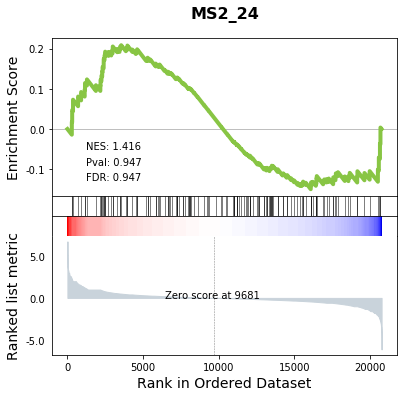

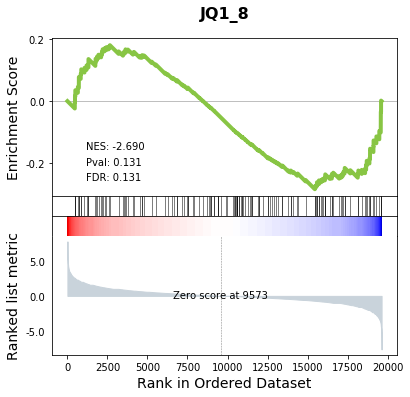

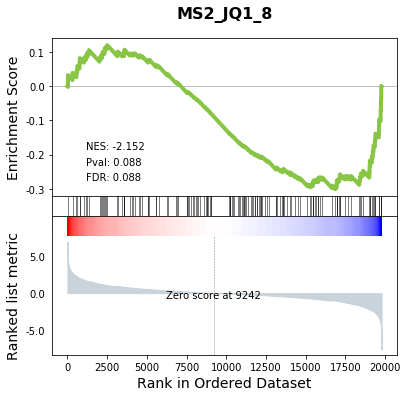

In [112]:
for i, check in enumerate(checks[1:]): 
    print(check)
    val = names[i]
    totest = counts[[v for v in counts.columns if check[0] in v and check[1] in v or '0h' in v]]
    cls = ['DMSO' if '0h' in v else 'Condition' for v in totest.columns]
    res[val] = gseapy.gsea(data=totest, gene_sets='data/apoptosis.gmt', 
                cls= cls, no_plot=False, processes=6)
    gseaplot(res[val].ranking, term=val, **res[val].results[terms[0]])

('1', '-8h')
('1', '-24h')
('2', '-2h')
('2', '-4h')
('2', '-8h')
('2', '-16h')
('2', '-24h')
('3', '-8h')
('4', '-8h')


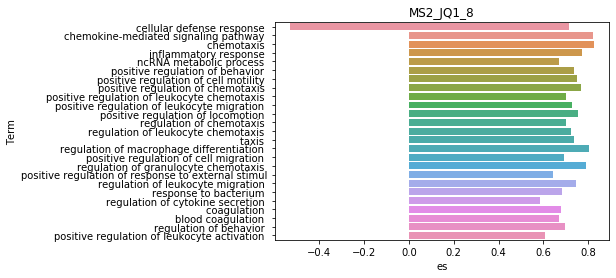

In [138]:
for i, check in enumerate(checks[1:]): 
    print(check)
    val = names[i]
    #totest = counts[[v for v in counts.columns if check[0] in v and check[1] in v or '0h' in v]]
    #cls = ['DMSO' if '0h' in v else 'Condition' for v in totest.columns]
    #res[val] = gseapy.gsea(data=totest, gene_sets='GO_Biological_Process_2015', 
    #            cls= cls, no_plot=False, processes=6)
    #res[val].res2d['Term'] = [i.split('(GO')[0][:50] for i in res[val].res2d.index]
    sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
                hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'DMSO_8')

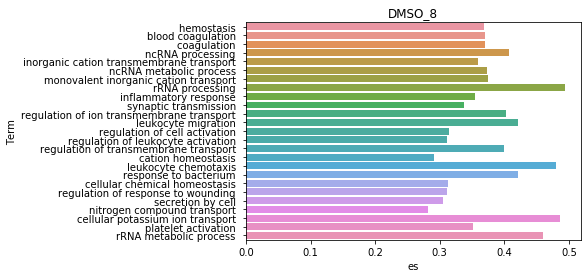

In [146]:
val = names[0]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'DMSO_24')

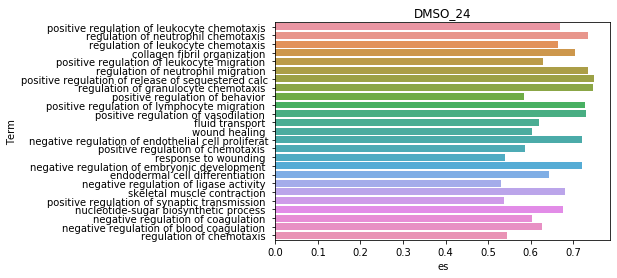

In [148]:
val = names[1]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'MS2_2')

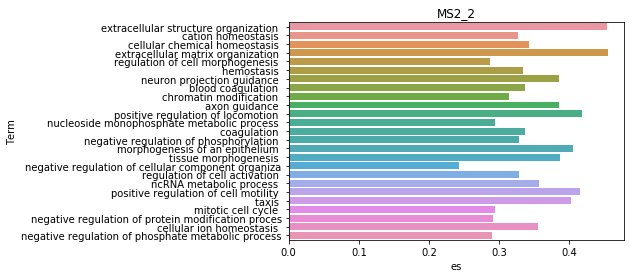

In [149]:
val = names[2]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'MS2_4')

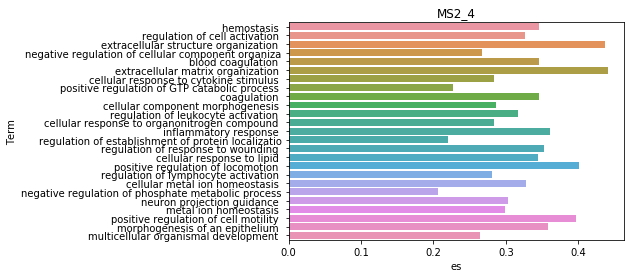

In [150]:
val = names[3]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'MS2_8')

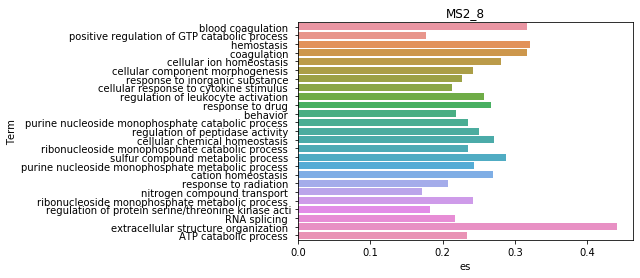

In [151]:
val = names[4]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'MS2_16')

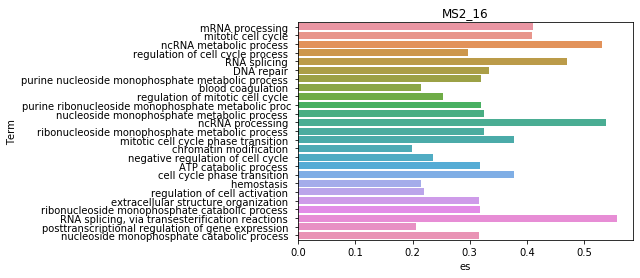

In [152]:
val = names[5]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'MS2_24')

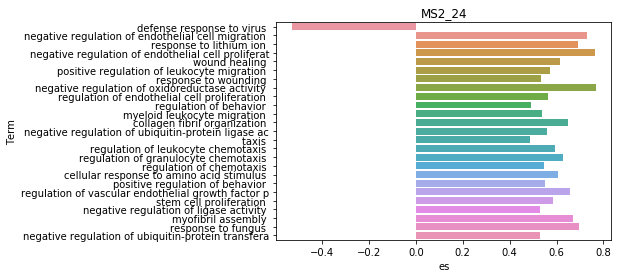

In [153]:
val = names[6]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

Text(0.5, 1.0, 'JQ1_8')

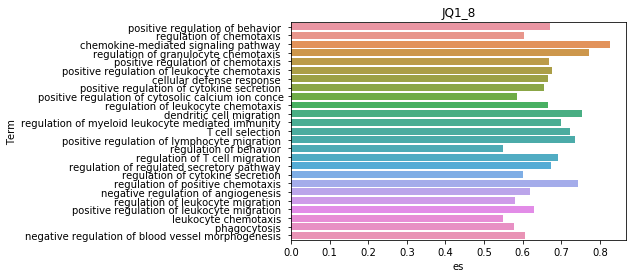

In [154]:
val = names[7]
sns.barplot(data=res[val].res2d.iloc[:25], x="es", y="Term",
            hue_order="geneset_size").set_title(val)

## Results

It seems looking at both plottings of raw RNA data and Differential Expression analysis, that the RNA seq experiment is sound except for the DMSO at 8h and 24h which seemed to have been either contaminated or misslabelled.


We cannot see much differential expression after 16h due to a likely transcriptional collapse destroying our signal. 

In [140]:
res

{'DMSO_8': <gseapy.gsea.GSEA at 0x7fd54b7f6250>,
 'DMSO_24': <gseapy.gsea.GSEA at 0x7fd54f1807d0>,
 'MS2_2': <gseapy.gsea.GSEA at 0x7fd55905f290>,
 'MS2_4': <gseapy.gsea.GSEA at 0x7fd541409f50>,
 'MS2_8': <gseapy.gsea.GSEA at 0x7fd5de3107d0>,
 'MS2_16': <gseapy.gsea.GSEA at 0x7fd5e4c16a50>,
 'MS2_24': <gseapy.gsea.GSEA at 0x7fd5e56056d0>,
 'JQ1_8': <gseapy.gsea.GSEA at 0x7fd532e39f50>,
 'MS2_JQ1_8': <gseapy.gsea.GSEA at 0x7fd52515dbd0>}

In [141]:
names

['DMSO_8',
 'DMSO_24',
 'MS2_2',
 'MS2_4',
 'MS2_8',
 'MS2_16',
 'MS2_24',
 'JQ1_8',
 'MS2_JQ1_8']